<a href="https://colab.research.google.com/github/tedyadika/Azureml/blob/main/AzureML_predictions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import Azure ML SDK modules

In [ ]:
!pip install azureml.core
!pip install numpy == 1.20
!pip install pycaret
!pip install azureml-dataset-runtime --upgrade
!pip install lazypredict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Invalid requirement: '=='
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from azureml.core import Workspace, Datastore,Dataset,Experiment,Run

### Import python modules

In [ ]:
%matplotlib inline
import datetime
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date,timedelta
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import joblib
from pycaret.regression import *
from lazypredict.Supervised import LazyRegressor

### Set up and data import 

In [ ]:
ws = Workspace.get(name= 'dscglobalceedamlt',
                    subscription_id= '8b20e38c-72fb-4030-a702-128e713479ca',
                    resource_group= 'DSCGlobalCEEDTANLTst')

az_store= Datastore.get(ws,'dscglobalceedamlsat_datastore')
az_dataset= Dataset.get_by_name(ws,'country_sdk')
az_default_store = ws.get_default_datastore()

### set up experiment

In [ ]:
experiment_run = Run.get_context()

In [ ]:
dataset1 =az_dataset.to_pandas_dataframe()

Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'


In [ ]:
df = dataset1.copy()
df = df.query('ORDTYP_map  == "ECOMM"')

In [ ]:
nulldf = df.isnull().sum()
for col in df.columns:
    experiment_run.log(col, nulldf[col])

Attempted to log scalar metric DATE:
0
Attempted to log scalar metric ORDTYP_map:
0
Attempted to log scalar metric COUNTRY_NAME:
0
Attempted to log scalar metric NBR_ORDERS:
0
Attempted to log scalar metric DW_SUM_ORDQTY_AD:
5459
Attempted to log scalar metric DW_QTY_REC_LS:
1939
Attempted to log scalar metric TOTAL_ORDNUM_LS:
1700
Attempted to log scalar metric TOTAL_ORDNUM_AD:
5459
Attempted to log scalar metric SUM_QTY_TOTAL_PICKS:
0
Attempted to log scalar metric SUM_QTY_PIECE_PICKS:
0


### ploting

<Figure size 720x216 with 0 Axes>

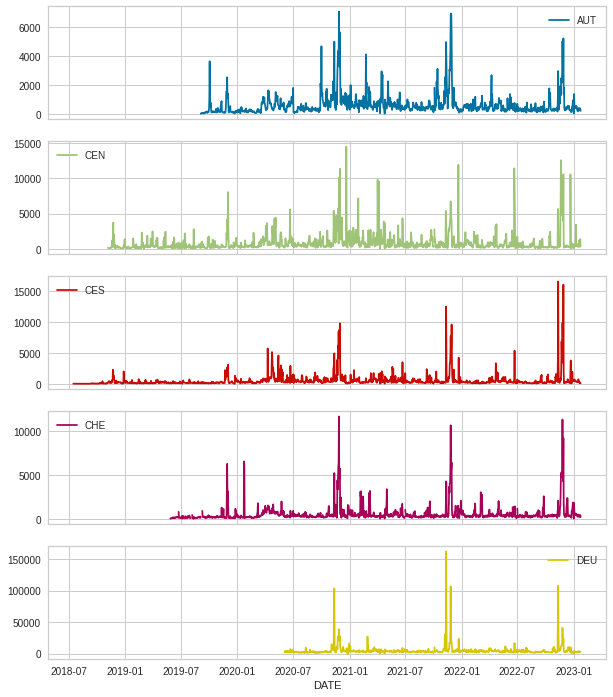

In [ ]:
plt.figure(figsize=(10,3))   
pd.pivot_table(df.reset_index(),
               index='DATE', columns='COUNTRY_NAME', values=('SUM_QTY_TOTAL_PICKS')
              ).plot(subplots=True,figsize=(10, 12))
           
plt.show()

### spliting our data by country 

In [ ]:
# Initialize an empty list
df_list = []
# Split the dataframe into separate datasets based on the values in the 'country' column
for name, group in df.groupby('COUNTRY_NAME'):
  df_list.append(group)



### Adding importang parameters to our data

In [ ]:
print(len(df_list))

5


In [ ]:
def add_values(data):
    #data = df.copy()
    data['DATE'] = pd.to_datetime(data['DATE'])
    data.sort_values('DATE', inplace=True)
    #data = data.resample('W', on='DATE').sum()
    #data.reset_index(inplace = True)
    data['logarithm_base2'] = np.log10(data['SUM_QTY_TOTAL_PICKS'])
    data['MA18'] = data['logarithm_base2'].shift(35).rolling(2).mean()
    data['MA16'] = data['logarithm_base2'].shift(21).rolling(7).mean()
    data['Month'] = [i.month for i in data['DATE']]
    data['Year'] = [i.year for i in data['DATE']]
    data['WEEK_YEAR'] = data['DATE'].dt.isocalendar().week 
    data['day_of_week'] = data['DATE'].dt.dayofweek
    data['DAY_YEAR'] = data['DATE'].dt.dayofyear
    data['DATE_N'] = data['DATE'].apply(lambda x:x.toordinal())
    data["WEEK_YEAR"] = data["WEEK_YEAR"].astype('int64').astype('int64')
    #data = data.fillna(data.median())
    return(data)



### Adding Lags

In [ ]:
col_list = ['TOTAL_ORDNUM_LS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','SUM_QTY_PIECE_PICKS','TOTAL_ORDNUM_AD','logarithm_base2']#'DW_SUM_ORDQTY','DW_QTY_REC','SUM_QTY_PIECE_PICKS','TOTAL_ORDNUM_AD','logarithm_base2'
lag = [7,14,21,28,35]

def add_lags(df_list,column_list,lag_list):
  for i in range(len(df_list)):
      df = df_list[i]#for df in df_list:
      add_values(df)
      for col in col_list:
        for l in lag:
          new_col_name = col + '_lag_' + str(l)
          new_col_name2 = col + '_mean_' + str(l)
          df_list[i][new_col_name] = df_list[i][col].shift(l)
          df_list[i][new_col_name2] = df_list[i][col].shift(l).rolling(l).mean()
          df_list[i] = df_list[i].fillna(df.mean())


          #df_list[i] =  df_list[i] .resample('W', on='DATE').sum()

add_lags(df_list,col_list,lag)


### Plotting

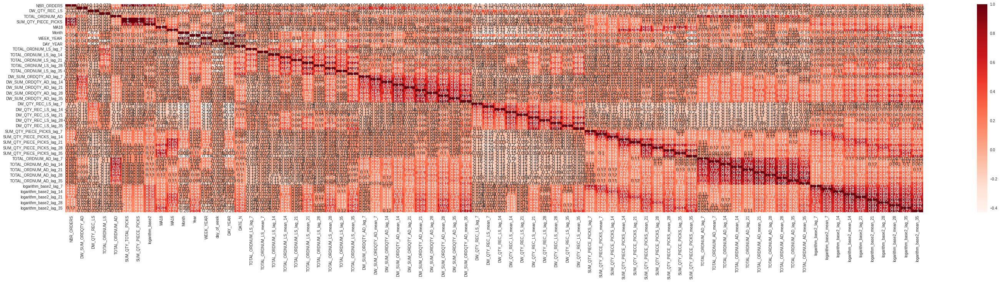

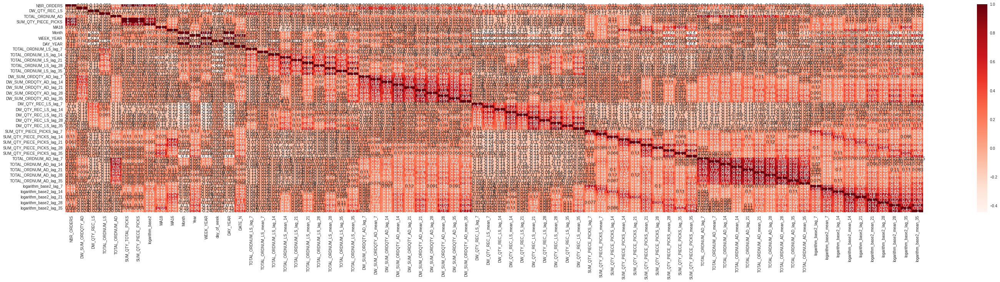

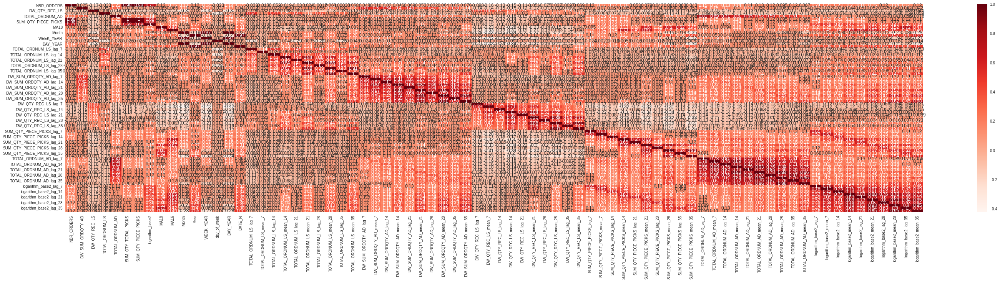

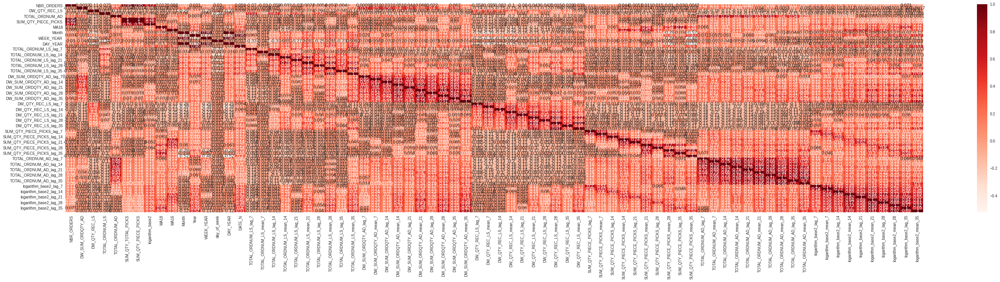

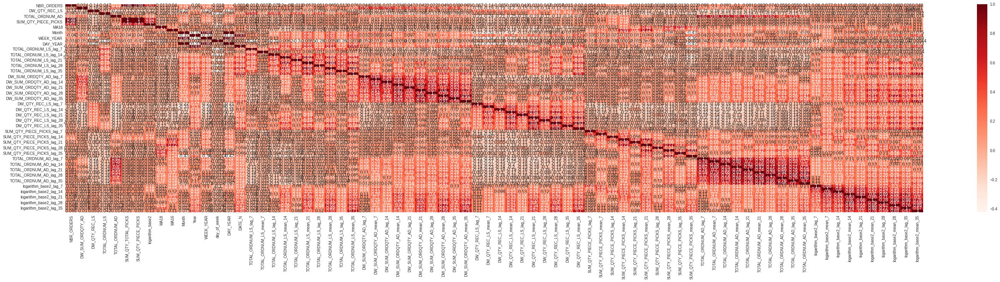

In [ ]:
for df in df_list:
    #df = df_list[i]#for df in df
    label= df['COUNTRY_NAME'].unique()
    df = df.fillna(0)
    plt.figure(figsize=(50,10))
    cor = df.corr()
    sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
    plt.legend(title = label)
    plt.show()

### AUSTRIA ML

In [ ]:
Aut_data1 = df_list[0].copy()
name = Aut_data1['COUNTRY_NAME'].unique()
Aut_data = Aut_data1.resample('W', on='DATE').sum()
Aut_data.reset_index(inplace = True)
Aut_data = add_values(Aut_data)
Aut_data = Aut_data.drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD'], axis=1)
Aut_data['COUNTRY_NAME'] = name[0]

### setting up our Algorithm

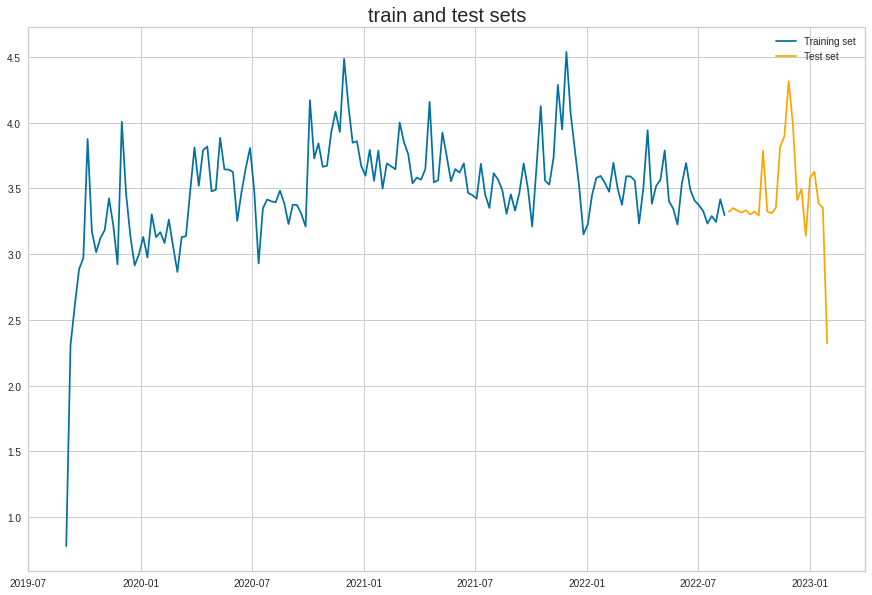

In [ ]:
test_size = 24

Aut_train = Aut_data[:-test_size]
Aut_test = Aut_data[-test_size:]
plt.figure(figsize=(15,10))
plt.title('train and test sets', size=20)
plt.plot(Aut_train.DATE,Aut_train.logarithm_base2, label='Training set')
plt.plot(Aut_test.DATE,Aut_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
s_AUT = setup(Aut_train, target = 'logarithm_base2', train_size = 0.95,
          data_split_shuffle = False, fold_strategy = 'timeseries',fold= 10,
          ignore_features = ['COUNTRY_NAME'],log_data = False,log_experiment=True,
          #numeric_features = ['day_of_year', 'year'],categorical_features = ['month', 'day_of_week'],
          silent = True, verbose = False, session_id = 123,normalize = True)

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: regression
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=logarithm_base2, ml_usecase=regression, available_plots={'parameter': 'Hyperparameters', 'residuals': 'Residuals', 'error': 'Prediction Error', 'cooks': 'Cooks Distance', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'vc': 'Validation Curve', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'tree': 'Decision Tree', 'residuals_interactive': 'Interactive Residuals'}, train_size=0.95, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_features=None, high_cardinality_features=None, high_cardinality_method=frequency, numeric_features=None, numeric_imputation=mean, numeric_iterative_imputer=lightgbm, date_features=None, ignore_feature

### comparing and finding best model

In [ ]:
best_AUT = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.25,0.10,0.30,-1.82,0.07,0.07,0.10
knn,K Neighbors Regressor,0.26,0.12,0.31,-1.93,0.07,0.07,0.01
rf,Random Forest Regressor,0.26,0.11,0.31,-2.23,0.07,0.07,0.26
et,Extra Trees Regressor,0.25,0.12,0.31,-2.28,0.07,0.07,0.20
en,Elastic Net,0.28,0.14,0.32,-2.33,0.07,0.07,0.02
lasso,Lasso Regression,0.28,0.14,0.33,-2.46,0.07,0.08,0.02
dummy,Dummy Regressor,0.28,0.14,0.33,-2.51,0.07,0.08,0.02
llar,Lasso Least Angle Regression,0.28,0.14,0.33,-2.51,0.07,0.08,0.01
lightgbm,Light Gradient Boosting Machine,0.28,0.13,0.33,-2.59,0.07,0.08,0.10
br,Bayesian Ridge,0.28,0.13,0.33,-2.93,0.07,0.08,0.01


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=123)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
evaluate_model(best_AUT)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=123), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### tuning model

In [ ]:
tuned_model_AUT = tune_model(best_AUT)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.12,0.03,0.17,-0.33,0.04,0.04
1,0.43,0.22,0.47,-6.40,0.10,0.12
2,0.24,0.08,0.28,-1.33,0.06,0.07
3,0.48,0.28,0.53,-2.26,0.11,0.12
4,0.16,0.04,0.20,-1.30,0.04,0.04
5,0.16,0.04,0.19,-0.11,0.04,0.04
6,0.17,0.04,0.20,-1.72,0.04,0.05
7,0.26,0.11,0.33,0.15,0.07,0.07
8,0.15,0.05,0.22,-1.14,0.05,0.04


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 3
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=1e-06, loss='linear',
                  n_estimators=240, random_state=123)
INFO:logs:tune_model() succesfully completed......................................


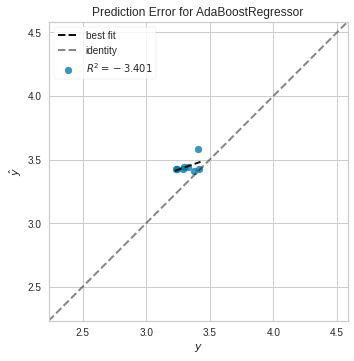

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_AUT, plot = 'error')

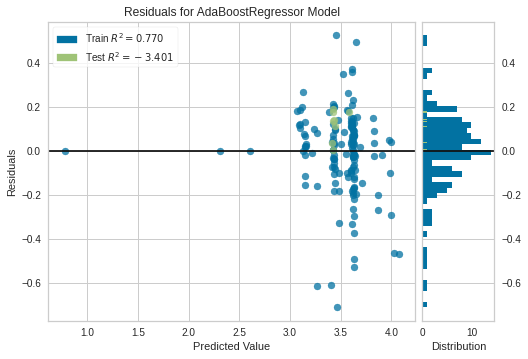

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_AUT, plot = 'residuals')

### ploting our best features 

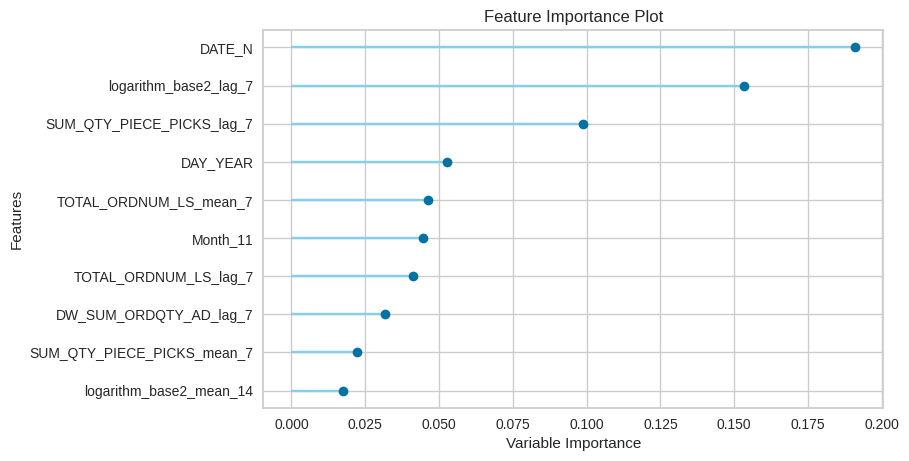

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_AUT, plot = 'feature')

### **Save the model** 

In [ ]:
save_model(tuned_model_AUT, 'AUT_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=AdaBoostRegressor(base_estimator=None, learning_rate=1e-06, loss='linear',
                  n_estimators=240, random_state=123), model_name=AUT_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['COUNTRY_NAME'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='logarithm_base2',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerica...
                ('P_transform', 'passthrough'), ('binn',

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['COUNTRY_NAME'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='logarithm_base2',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerica...
                 ('dummy', Dummify(target='logarithm_base2')),
                 ('fix_perfect', Remove_100(target='logarithm_base2')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'

## loading saved model

In [ ]:
#loaded_model = load_model('AUT_model')

## creating future dataset

In [ ]:
prediction_df =[]

In [ ]:
future_dates = pd.date_range(start=date.today(), periods=21, freq='d')
future_data = pd.DataFrame(future_dates)
# add columns
future_data.columns = ['DATE']
future_df = pd.concat([Aut_data1,future_data],ignore_index=True)
name = future_df['COUNTRY_NAME'].unique()
future_df = add_values(future_df)
future_list =[]
future_list.append(future_df)

add_lags(future_list,col_list,lag)
future_list[0] = future_list[0].resample('W', on='DATE').sum()
future_list[0].reset_index(inplace = True)
add_values(future_list[0])
future_list[0] = future_list[0].drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD','logarithm_base2'], axis=1)
future_list[0] = future_list[0].fillna(future_list[0].mean())
future_list[0]['COUNTRY_NAME'] = name[0]
future_list[0].tail()

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME
177,2023-01-22,3.37,3.31,1,2023,3,6,22,738542,51329.96,...,18.20,19.17,18.02,18.19,17.66,15.94,19.03,18.44,20.50,AUT
178,2023-01-29,3.29,3.32,1,2023,4,6,29,738549,51329.96,...,17.30,17.54,18.37,19.17,17.69,18.19,17.71,15.94,19.84,AUT
179,2023-02-05,3.38,3.33,2,2023,5,6,36,738556,51329.96,...,17.67,17.50,17.75,17.54,18.08,19.17,17.88,18.19,18.72,AUT
180,2023-02-12,3.61,3.34,2,2023,6,6,43,738563,51329.96,...,18.37,18.06,17.48,17.50,18.02,17.54,17.82,19.17,17.88,AUT
181,2023-02-19,3.59,3.32,2,2023,7,6,50,738570,7332.85,...,2.62,2.62,2.54,2.32,2.54,2.61,2.54,2.74,2.57,AUT


### Making future dataset

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1e-06, loss='linear',
                  n_estimators=240, random_state=123), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


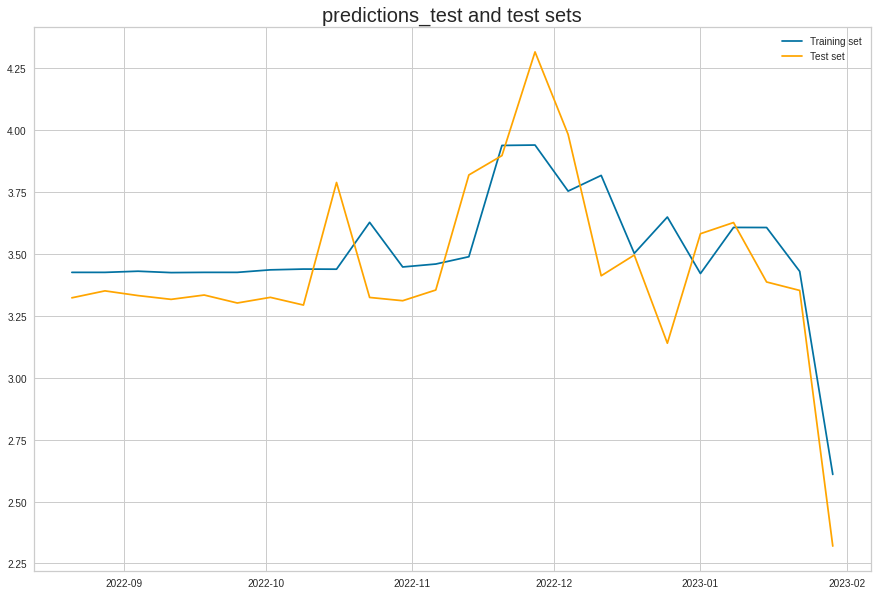

In [ ]:
predictions_test = predict_model(tuned_model_AUT, data=Aut_test.drop(['logarithm_base2'], axis=1))
plt.figure(figsize=(15,10))
plt.title('predictions_test and test sets', size=20)
plt.plot(predictions_test.DATE,predictions_test.Label, label='Training set')
plt.plot(Aut_test.DATE,Aut_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
predictions_aut = predict_model(tuned_model_AUT, data=future_list[0])
predictions_aut['prediction'] = 10 ** predictions_aut['Label'] 
predictions_aut['COUNTRY_NAME'] = name[0]
prediction_df.append(predictions_aut)
pd.set_option('display.max_columns', None)
predictions_aut.tail()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1e-06, loss='linear',
                  n_estimators=240, random_state=123), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,TOTAL_ORDNUM_LS_mean_7,TOTAL_ORDNUM_LS_lag_14,TOTAL_ORDNUM_LS_mean_14,TOTAL_ORDNUM_LS_lag_21,TOTAL_ORDNUM_LS_mean_21,TOTAL_ORDNUM_LS_lag_28,TOTAL_ORDNUM_LS_mean_28,TOTAL_ORDNUM_LS_lag_35,TOTAL_ORDNUM_LS_mean_35,DW_SUM_ORDQTY_AD_lag_7,DW_SUM_ORDQTY_AD_mean_7,DW_SUM_ORDQTY_AD_lag_14,DW_SUM_ORDQTY_AD_mean_14,DW_SUM_ORDQTY_AD_lag_21,DW_SUM_ORDQTY_AD_mean_21,DW_SUM_ORDQTY_AD_lag_28,DW_SUM_ORDQTY_AD_mean_28,DW_SUM_ORDQTY_AD_lag_35,DW_SUM_ORDQTY_AD_mean_35,DW_QTY_REC_LS_lag_7,DW_QTY_REC_LS_mean_7,DW_QTY_REC_LS_lag_14,DW_QTY_REC_LS_mean_14,DW_QTY_REC_LS_lag_21,DW_QTY_REC_LS_mean_21,DW_QTY_REC_LS_lag_28,DW_QTY_REC_LS_mean_28,DW_QTY_REC_LS_lag_35,DW_QTY_REC_LS_mean_35,SUM_QTY_PIECE_PICKS_lag_7,SUM_QTY_PIECE_PICKS_mean_7,SUM_QTY_PIECE_PICKS_lag_14,SUM_QTY_PIECE_PICKS_mean_14,SUM_QTY_PIECE_PICKS_lag_21,SUM_QTY_PIECE_PICKS_mean_21,SUM_QTY_PIECE_PICKS_lag_28,SUM_QTY_PIECE_PICKS_mean_28,SUM_QTY_PIECE_PICKS_lag_35,SUM_QTY_PIECE_PICKS_mean_35,TOTAL_ORDNUM_AD_lag_7,TOTAL_ORDNUM_AD_mean_7,TOTAL_ORDNUM_AD_lag_14,TOTAL_ORDNUM_AD_mean_14,TOTAL_ORDNUM_AD_lag_21,TOTAL_ORDNUM_AD_mean_21,TOTAL_ORDNUM_AD_lag_28,TOTAL_ORDNUM_AD_mean_28,TOTAL_ORDNUM_AD_lag_35,TOTAL_ORDNUM_AD_mean_35,logarithm_base2_lag_7,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME,Label,prediction
177,2023-01-22,3.37,3.31,1,2023,3,6,22,738542,51329.96,51243.31,46857.41,37014.92,31379.70,40142.99,45060.70,49571.03,40565.70,54525.76,164994.59,165973.16,173289.62,173624.67,166236.66,195421.02,208158.31,207601.15,200288.66,194572.87,99568.02,94353.01,75603.01,87651.22,96027.01,83751.20,93727.00,65143.97,75219.00,64458.38,2431.00,2928.00,4228.00,3596.14,3808.00,2653.24,1377.00,6454.11,3123.00,9223.51,13105.82,14752.42,29079.04,30702.30,30016.26,33087.54,33181.52,41270.25,35201.26,42746.35,17.54,18.20,19.17,18.02,18.19,17.66,15.94,19.03,18.44,20.50,AUT,3.43,2687.87
178,2023-01-29,3.29,3.32,1,2023,4,6,29,738549,51329.96,51329.96,51329.96,45609.65,46857.41,39212.80,31379.70,42097.20,45060.70,52405.15,164994.59,164994.59,164994.59,165035.86,173289.62,181971.27,166236.66,205754.85,208158.31,199676.78,99568.02,99568.02,99568.02,87496.80,75603.01,87509.48,96027.01,75253.54,93727.00,64575.35,2249.00,2151.57,2431.00,3643.93,4228.00,3074.90,3808.00,2710.89,1377.00,8217.43,13105.82,13105.82,13105.82,23145.77,29079.04,31552.02,30016.26,34993.49,33181.52,42403.09,17.50,17.30,17.54,18.37,19.17,17.69,18.19,17.71,15.94,19.84,AUT,3.43,2702.63
179,2023-02-05,3.38,3.33,2,2023,5,6,36,738556,51329.96,51305.20,51329.96,51286.64,51329.96,41757.72,46857.41,40101.24,31379.70,46467.59,164994.59,164994.59,164994.59,165483.88,164994.59,171074.17,173289.62,187590.40,166236.66,202711.08,99568.02,99568.02,99568.02,96960.52,99568.02,89885.15,75603.01,82973.54,96027.01,71047.55,3949.15,3023.93,2249.00,2539.79,2431.00,3373.43,4228.00,3079.89,3808.00,5729.77,13105.82,13105.82,13105.82,13929.12,13105.82,25385.68,29079.04,32700.43,30016.26,38989.30,18.06,17.67,17.50,17.75,17.54,18.08,19.17,17.88,18.19,18.72,AUT,3.56,3593.32
180,2023-02-12,3.61,3.34,2,2023,6,6,43,738563,51329.96,51301.08,51329.96,51329.96,51329.96,47516.42,51329.96,42220.43,46857.41,41672.96,164994.59,164994.59,164994.59,164994.59,164994.59,165022.10,164994.59,177971.74,173289.62,197423.59,99568.02,99568.02,99568.02,99568.02,99568.02,91520.54,99568.02,89220.37,75603.01,76330.95,4363.51,4363.51,3949.15,2587.75,2249.00,3146.48,2431.00,3038.18,4228.00,3040.69,13105.82,13105.82,13105.82,13105.82,13105.82,19799.12,13105.82,27352.12,29079.04,34302.62,18.37,18.37,18.06,17.48,17.50,18.02,17.54,17.82,19.17,17.88,AUT,3.60,4025.11
181,2023-02-19,3.59,3.32,2,2023,7,6,50,738570,7332.85,7328.73,7332.85,7332.85,7332.85,7344.06,7332.85,6302.88,7332.85,5926.86,23570.66,23570.66,23570.66,23570.66,23570.66,23640.59,23570

### **BGR ML**

In [ ]:
Bgr_data1 = df_list[1].copy()
name = Bgr_data1['COUNTRY_NAME'].unique()
Bgr_data = Bgr_data1.resample('W', on='DATE').sum()
Bgr_data.reset_index(inplace = True)
Bgr_data = add_values(Bgr_data)
Bgr_data = Bgr_data.drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD'], axis=1)
Bgr_data['COUNTRY_NAME'] = name[0]

### Setting up Algorithm 

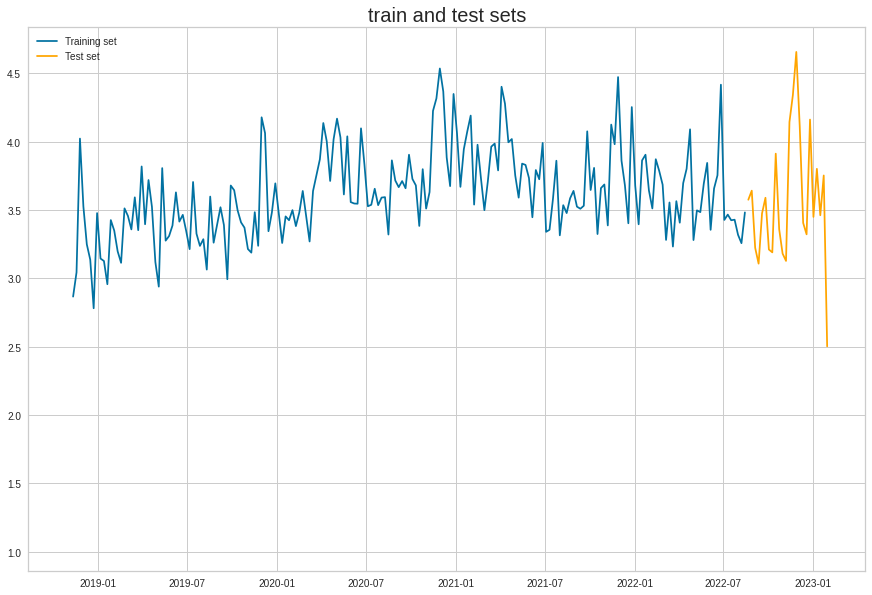

In [ ]:
test_size = 24

BGR_train = Bgr_data[:-test_size]
BGR_test = Bgr_data[-test_size:]
plt.figure(figsize=(15,10))
plt.title('train and test sets', size=20)
plt.plot(BGR_train.DATE,BGR_train.logarithm_base2, label='Training set')
plt.plot(BGR_test.DATE,BGR_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
s = setup(BGR_train, target = 'logarithm_base2', train_size = 0.95,
          data_split_shuffle = False, fold_strategy = 'timeseries', fold = 10,
          ignore_features = ['COUNTRY_NAME'],log_data = False,log_experiment=True,
          #numeric_features = ['day_of_year', 'year'],categorical_features = ['month', 'day_of_week'],
          silent = True, verbose = False, session_id = 124,normalize = False)

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: regression
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=logarithm_base2, ml_usecase=regression, available_plots={'parameter': 'Hyperparameters', 'residuals': 'Residuals', 'error': 'Prediction Error', 'cooks': 'Cooks Distance', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'vc': 'Validation Curve', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'tree': 'Decision Tree', 'residuals_interactive': 'Interactive Residuals'}, train_size=0.95, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_features=None, high_cardinality_features=None, high_cardinality_method=frequency, numeric_features=None, numeric_imputation=mean, numeric_iterative_imputer=lightgbm, date_features=None, ignore_feature

### comparing models

In [ ]:
best_BGR = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.25,0.11,0.32,-0.75,0.07,0.07,0.10
rf,Random Forest Regressor,0.25,0.11,0.31,-0.83,0.07,0.07,0.31
lightgbm,Light Gradient Boosting Machine,0.26,0.11,0.33,-0.96,0.07,0.07,0.10
gbr,Gradient Boosting Regressor,0.27,0.13,0.34,-1.11,0.07,0.07,0.12
dummy,Dummy Regressor,0.28,0.13,0.34,-1.14,0.07,0.07,0.01
llar,Lasso Least Angle Regression,0.28,0.13,0.34,-1.14,0.07,0.07,0.30
knn,K Neighbors Regressor,0.28,0.12,0.34,-1.16,0.07,0.07,0.02
et,Extra Trees Regressor,0.30,0.18,0.38,-2.80,0.09,0.08,0.21
huber,Huber Regressor,0.37,0.25,0.45,-3.26,0.10,0.10,0.04
dt,Decision Tree Regressor,0.41,0.31,0.50,-4.09,0.12,0.11,0.02


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=124)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
evaluate_model(best_BGR)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=124), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### tuning model

In [ ]:
tuned_model_BGR = tune_model(best_BGR)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.28,0.10,0.31,-0.98,0.07,0.08
1,0.16,0.04,0.20,-0.00,0.05,0.05
2,0.23,0.10,0.32,-0.45,0.07,0.06
3,0.39,0.21,0.46,-1.98,0.10,0.10
4,0.15,0.04,0.20,-0.77,0.04,0.04
5,0.31,0.15,0.38,-0.56,0.08,0.07
6,0.21,0.07,0.27,-0.28,0.06,0.05
7,0.19,0.05,0.22,-0.08,0.05,0.05
8,0.26,0.12,0.34,-0.18,0.07,0.07


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 3
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=1e-07, loss='linear',
                  n_estimators=180, random_state=124)
INFO:logs:tune_model() succesfully completed......................................


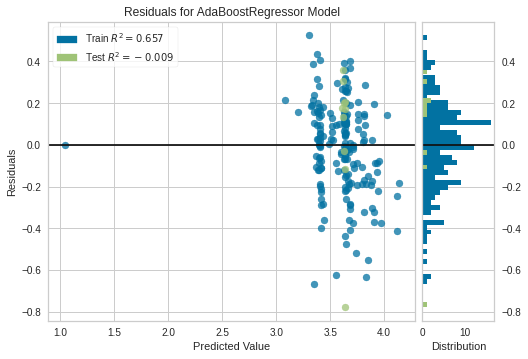

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_BGR, plot = 'residuals')

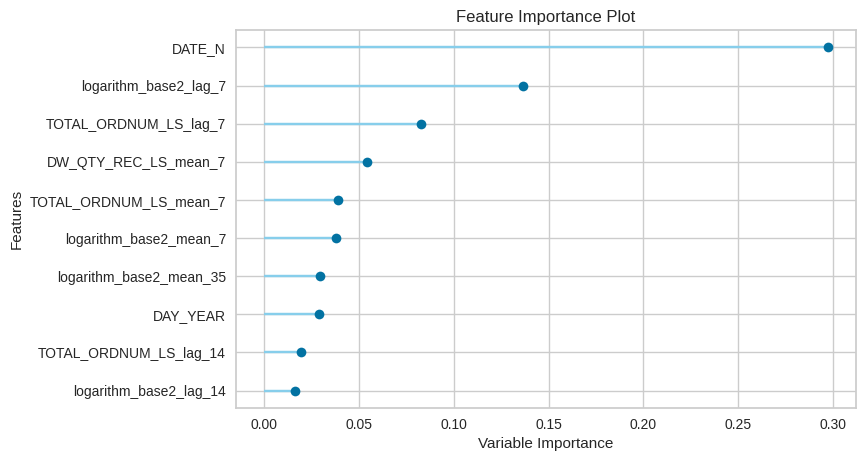

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_BGR, plot = 'feature')

###Save the model

In [ ]:
save_model(tuned_model_BGR, 'BGR_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=AdaBoostRegressor(base_estimator=None, learning_rate=1e-07, loss='linear',
                  n_estimators=180, random_state=124), model_name=BGR_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['COUNTRY_NAME'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='logarithm_base2',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerica...
                ('scaling', 'passthrough'), ('P_transfor

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['COUNTRY_NAME'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='logarithm_base2',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerica...
                 ('dummy', Dummify(target='logarithm_base2')),
                 ('fix_perfect', Remove_100(target='logarithm_base2')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'

###loading saved model

In [ ]:
#loaded_model = load_model('BGR_model')

### creating future dataset

In [ ]:
future_dates = pd.date_range(start=date.today(), periods=21, freq='d')
future_data = pd.DataFrame(future_dates)
# add columns
future_data.columns = ['DATE']
future_df = pd.concat([Bgr_data1,future_data],ignore_index=True)
name = future_df['COUNTRY_NAME'].unique()
future_df = add_values(future_df)
future_list =[]
future_list.append(future_df)

add_lags(future_list,col_list,lag)
future_list[0] = future_list[0].resample('W', on='DATE').sum()
future_list[0].reset_index(inplace = True)
add_values(future_list[0])
future_list[0] = future_list[0].drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD','logarithm_base2'], axis=1)
future_list[0] = future_list[0].fillna(future_list[0].mean())
future_list[0]['COUNTRY_NAME'] = name[0]
future_list[0].tail()

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME
221,2023-01-22,3.59,3.45,1,2023,3,6,22,738542,53020.12,...,19.24,19.61,17.67,17.61,17.65,17.65,19.05,17.25,20.79,CEN
222,2023-01-29,3.77,3.42,1,2023,4,6,29,738549,53020.12,...,18.89,18.27,18.67,19.61,17.79,17.61,17.62,17.65,20.34,CEN
223,2023-02-05,3.60,3.37,2,2023,5,6,36,738556,53020.12,...,19.34,19.96,19.06,18.27,18.19,19.61,17.76,17.61,18.69,CEN
224,2023-02-12,3.51,3.39,2,2023,6,6,43,738563,53020.12,...,18.69,18.52,19.11,19.96,18.74,18.27,18.15,19.61,17.72,CEN
225,2023-02-19,3.71,3.44,2,2023,7,6,50,738570,7574.30,...,2.67,2.67,2.73,2.50,2.74,2.87,2.63,2.70,2.57,CEN


### making predictions

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1e-07, loss='linear',
                  n_estimators=180, random_state=124), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


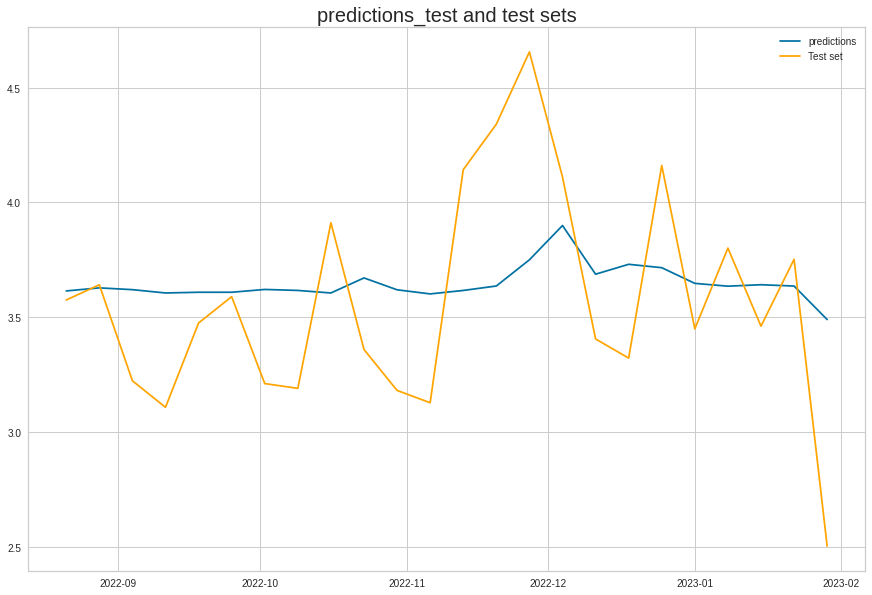

In [ ]:
predictions_test = predict_model(tuned_model_BGR, data=BGR_test.drop(['logarithm_base2'], axis=1))
plt.figure(figsize=(15,10))
plt.title('predictions_test and test sets', size=20)
plt.plot(predictions_test.DATE,predictions_test.Label, label='predictions')
plt.plot(BGR_test.DATE,BGR_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
predictions_bgr = predict_model(tuned_model_BGR, data=future_list[0])
predictions_bgr['prediction'] = 10 ** predictions_bgr['Label'] 
predictions_bgr['COUNTRY_NAME'] = name[0]
prediction_df.append(predictions_bgr)


INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1e-07, loss='linear',
                  n_estimators=180, random_state=124), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


### CEN ML

In [ ]:
CEN_data1 = df_list[2].copy()
name = CEN_data1['COUNTRY_NAME'].unique()
CEN_data = CEN_data1.resample('W', on='DATE').sum()
CEN_data.reset_index(inplace = True)
CEN_data = add_values(CEN_data)
CEN_data = CEN_data.drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD'], axis=1)
CEN_data['COUNTRY_NAME'] = name[0]

### Setting the algorithms

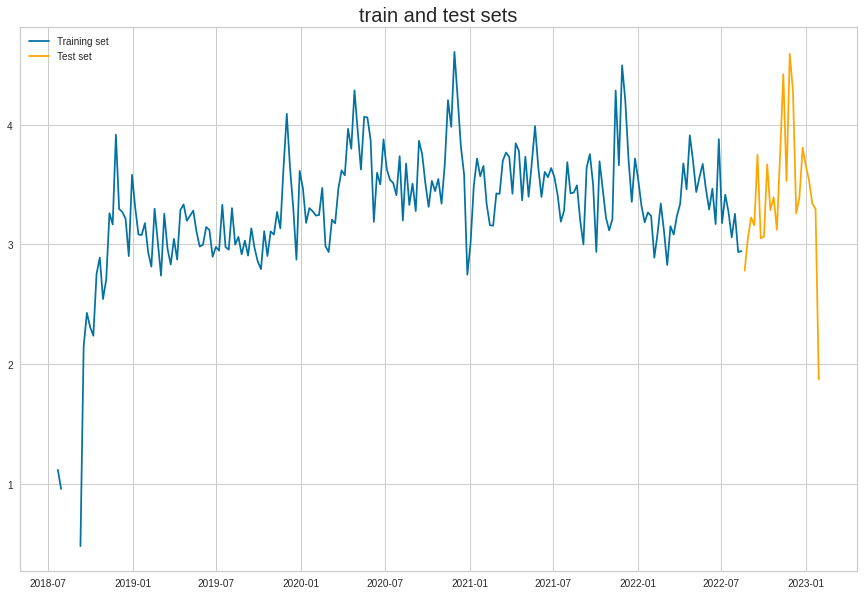

In [ ]:
test_size = 24

CEN_train = CEN_data[:-test_size]
CEN_test = CEN_data[-test_size:]
plt.figure(figsize=(15,10))
plt.title('train and test sets', size=20)
plt.plot(CEN_train.DATE,CEN_train.logarithm_base2, label='Training set')
plt.plot(CEN_test.DATE,CEN_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
s = setup(CEN_train, target = 'logarithm_base2', train_size = 0.9,
          data_split_shuffle = False, fold_strategy = 'timeseries', fold = 3,
          ignore_features = ['COUNTRY_NAME'],log_data = False,log_experiment=True,
          #numeric_features = ['day_of_year', 'year'],categorical_features = ['month', 'day_of_week'],
          silent = True, verbose = False, session_id = 125,normalize = False)

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: regression
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=logarithm_base2, ml_usecase=regression, available_plots={'parameter': 'Hyperparameters', 'residuals': 'Residuals', 'error': 'Prediction Error', 'cooks': 'Cooks Distance', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'vc': 'Validation Curve', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'tree': 'Decision Tree', 'residuals_interactive': 'Interactive Residuals'}, train_size=0.9, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_features=None, high_cardinality_features=None, high_cardinality_method=frequency, numeric_features=None, numeric_imputation=mean, numeric_iterative_imputer=lightgbm, date_features=None, ignore_features

### comparing the models

In [ ]:
best_CEN = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.26,0.13,0.35,-0.02,0.08,0.07,0.11
et,Extra Trees Regressor,0.27,0.14,0.36,-0.08,0.08,0.08,0.26
rf,Random Forest Regressor,0.27,0.15,0.37,-0.14,0.08,0.08,0.33
omp,Orthogonal Matching Pursuit,0.30,0.15,0.38,-0.25,0.09,0.09,0.02
gbr,Gradient Boosting Regressor,0.31,0.18,0.41,-0.38,0.09,0.09,0.13
huber,Huber Regressor,0.32,0.18,0.43,-0.54,0.10,0.09,0.04
lightgbm,Light Gradient Boosting Machine,0.36,0.22,0.46,-0.72,0.10,0.10,0.05
knn,K Neighbors Regressor,0.38,0.23,0.47,-0.86,0.11,0.11,0.03
par,Passive Aggressive Regressor,0.38,0.24,0.47,-1.05,0.11,0.11,0.02
llar,Lasso Least Angle Regression,0.42,0.28,0.52,-1.32,0.12,0.11,0.02


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=125)
INFO:logs:compare_models() succesfully completed......................................


### evaluating our best model

In [ ]:
evaluate_model(best_CEN)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=125), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [ ]:
tuned_model_CEN = tune_model(best_CEN)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.32,0.18,0.43,-0.23,0.10,0.09
1,0.23,0.09,0.30,0.10,0.07,0.07
2,0.23,0.10,0.31,0.18,0.07,0.07
Mean,0.26,0.12,0.35,0.02,0.08,0.07
Std,0.04,0.04,0.06,0.18,0.01,0.01


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 3
INFO:logs:AdaBoostRegressor(base_estimator=None, learning_rate=0.5, loss='square',
                  n_estimators=60, random_state=125)
INFO:logs:tune_model() succesfully completed......................................


### ploting the residuals 

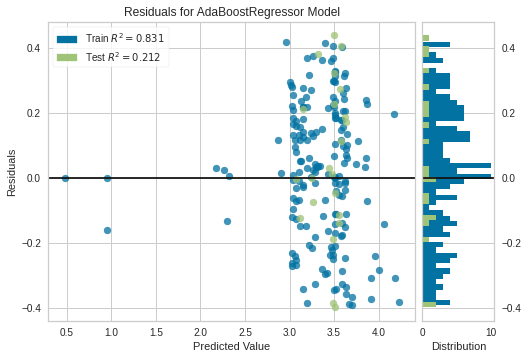

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_CEN, plot = 'residuals')

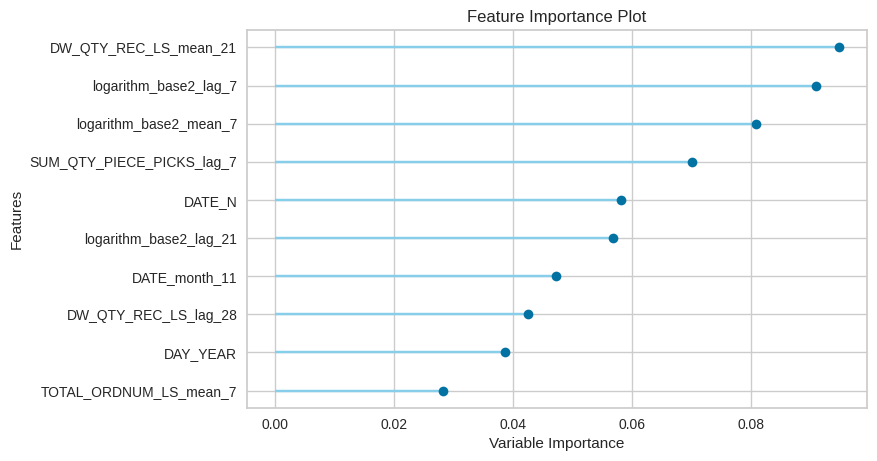

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_CEN, plot = 'feature')

### saving our best model

In [ ]:
save_model(tuned_model_CEN, 'CEN_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=AdaBoostRegressor(base_estimator=None, learning_rate=0.5, loss='square',
                  n_estimators=60, random_state=125), model_name=CEN_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['COUNTRY_NAME'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='logarithm_base2',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerica...
                ('scaling', 'passthrough'), ('P_transform',

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['COUNTRY_NAME'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='logarithm_base2',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerica...
                 ('dummy', Dummify(target='logarithm_base2')),
                 ('fix_perfect', Remove_100(target='logarithm_base2')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'

### loading our model 

In [ ]:
#loaded_model = load_model('CEN_model')

### creating future dataframe

In [ ]:
future_dates = pd.date_range(start=date.today(), periods=21, freq='d')
future_data = pd.DataFrame(future_dates)
# add columns
future_data.columns = ['DATE']
future_df = pd.concat([CEN_data1,future_data],ignore_index=True)
name = future_df['COUNTRY_NAME'].unique()
future_df = add_values(future_df)
future_list =[]
future_list.append(future_df)

add_lags(future_list,col_list,lag)
future_list[0] = future_list[0].resample('W', on='DATE').sum()
future_list[0].reset_index(inplace = True)
add_values(future_list[0])
future_list[0] = future_list[0].drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD','logarithm_base2'], axis=1)
future_list[0] = future_list[0].fillna(future_list[0].mean())
future_list[0]['COUNTRY_NAME'] = name[0]
future_list[0].tail()

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME
235,2023-01-22,3.62,3.04,1,2023,3,6,22,738542,53067.28,...,17.89,18.70,18.17,18.31,17.44,17.33,19.00,17.82,20.20,CES
236,2023-01-29,3.57,3.03,1,2023,4,6,29,738549,53067.28,...,17.24,17.41,18.52,18.70,17.97,18.31,17.28,17.33,19.56,CES
237,2023-02-05,3.38,3.05,2,2023,5,6,36,738556,53067.28,...,16.01,16.68,17.57,17.41,18.08,18.70,17.87,18.31,18.64,CES
238,2023-02-12,3.38,3.12,2,2023,6,6,43,738563,53067.28,...,17.13,16.55,16.63,16.68,18.09,17.41,17.95,18.70,17.65,CES
239,2023-02-19,3.32,3.14,2,2023,7,6,50,738570,7581.04,...,2.45,2.45,2.34,1.87,2.47,2.86,2.58,2.56,2.54,CES


### making prediction and appending 

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=0.5, loss='square',
                  n_estimators=60, random_state=125), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


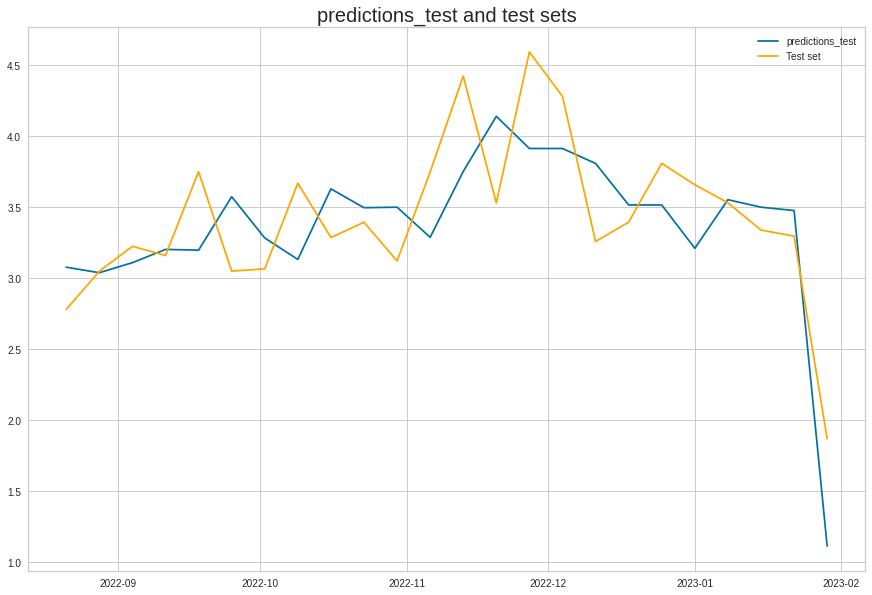

In [ ]:
predictions_test = predict_model(tuned_model_CEN, data=CEN_test.drop(['logarithm_base2'], axis=1))
plt.figure(figsize=(15,10))
plt.title('predictions_test and test sets', size=20)
plt.plot(predictions_test.DATE,predictions_test.Label, label='predictions_test')
plt.plot(CEN_test.DATE,CEN_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
predictions_cen = predict_model(tuned_model_CEN, data=future_list[0])
predictions_cen['prediction'] = 10 ** predictions_cen['Label'] 
predictions_cen['COUNTRY_NAME'] = name[0]
prediction_df.append(predictions_cen)
predictions_cen.tail()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=AdaBoostRegressor(base_estimator=None, learning_rate=0.5, loss='square',
                  n_estimators=60, random_state=125), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME,Label,prediction
235,2023-01-22,3.62,3.04,1,2023,3,6,22,738542,53067.28,...,18.17,18.31,17.44,17.33,19.00,17.82,20.20,CES,3.48,2987.29
236,2023-01-29,3.57,3.03,1,2023,4,6,29,738549,53067.28,...,18.52,18.70,17.97,18.31,17.28,17.33,19.56,CES,3.43,2703.08
237,2023-02-05,3.38,3.05,2,2023,5,6,36,738556,53067.28,...,17.57,17.41,18.08,18.70,17.87,18.31,18.64,CES,3.40,2500.44
238,2023-02-12,3.38,3.12,2,2023,6,6,43,738563,53067.28,...,16.63,16.68,18.09,17.41,17.95,18.70,17.65,CES,3.48,2991.25
239,2023-02-19,3.32,3.14,2,2023,7,6,50,738570,7581.04,...,2.34,1.87,2.47,2.86,2.58,2.56,2.54,CES,1.11,13.00


### CES ML

In [ ]:
CES_data1 = df_list[3].copy()
name = CES_data1['COUNTRY_NAME'].unique()
CES_data = CES_data1.resample('W', on='DATE').sum()
CES_data.reset_index(inplace = True)
CES_data = add_values(CES_data)
CES_data = CES_data.drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD'], axis=1)
CES_data['COUNTRY_NAME'] = name[0]

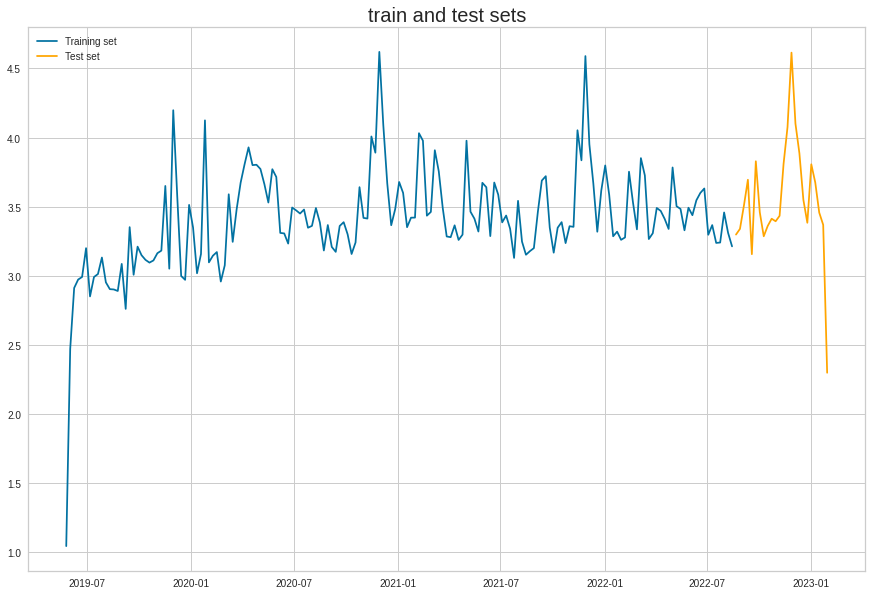

In [ ]:
test_size = 24
CES_train = CES_data[:-test_size]
CES_test = CES_data[-test_size:]
plt.figure(figsize=(15,10))
plt.title('train and test sets', size=20)
plt.plot(CES_train.DATE,CES_train.logarithm_base2, label='Training set')
plt.plot(CES_test.DATE,CES_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
s = setup(CES_train, target = 'logarithm_base2', train_size = 0.95,
          data_split_shuffle = False, fold_strategy = 'timeseries', fold = 10,
          ignore_features = ['COUNTRY_NAME'],log_data = False,log_experiment=True,
          #numeric_features = ['day_of_year', 'year'],categorical_features = ['month', 'day_of_week'],
          silent = True, verbose = False, session_id = 126,normalize = True)

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: regression
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=logarithm_base2, ml_usecase=regression, available_plots={'parameter': 'Hyperparameters', 'residuals': 'Residuals', 'error': 'Prediction Error', 'cooks': 'Cooks Distance', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'vc': 'Validation Curve', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'tree': 'Decision Tree', 'residuals_interactive': 'Interactive Residuals'}, train_size=0.95, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_features=None, high_cardinality_features=None, high_cardinality_method=frequency, numeric_features=None, numeric_imputation=mean, numeric_iterative_imputer=lightgbm, date_features=None, ignore_feature

In [ ]:
best_CES = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,0.22,0.10,0.30,-0.37,0.06,0.06,0.02
knn,K Neighbors Regressor,0.23,0.11,0.31,-0.45,0.07,0.06,0.02
ada,AdaBoost Regressor,0.24,0.10,0.30,-0.49,0.07,0.07,0.09
rf,Random Forest Regressor,0.24,0.10,0.30,-0.52,0.07,0.07,0.28
en,Elastic Net,0.27,0.14,0.35,-0.96,0.08,0.07,0.01
llar,Lasso Least Angle Regression,0.27,0.15,0.36,-1.00,0.08,0.07,0.34
dummy,Dummy Regressor,0.27,0.15,0.36,-1.00,0.08,0.07,0.01
lasso,Lasso Regression,0.27,0.15,0.36,-1.00,0.08,0.07,0.01
gbr,Gradient Boosting Regressor,0.28,0.13,0.34,-1.15,0.08,0.08,0.11
lightgbm,Light Gradient Boosting Machine,0.28,0.15,0.36,-1.25,0.08,0.08,0.10


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
evaluate_model(best_CES)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### Tunning our model

In [ ]:
tuned_model_CES = tune_model(best_CES)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.24,0.14,0.38,-0.28,0.08,0.07
1,0.44,0.29,0.54,-1.26,0.12,0.12
2,0.43,0.33,0.58,-8.74,0.14,0.12
3,0.10,0.02,0.14,-0.16,0.03,0.03
4,0.32,0.20,0.45,-0.57,0.09,0.08
5,0.22,0.08,0.28,-0.18,0.06,0.06
6,0.18,0.04,0.21,-0.22,0.05,0.06
7,0.23,0.12,0.34,0.18,0.07,0.06
8,0.19,0.07,0.26,-0.24,0.06,0.05


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 3
INFO:logs:BayesianRidge(alpha_1=0.0001, alpha_2=0.15, alpha_init=None, compute_score=True,
              copy_X=True, fit_intercept=True, lambda_1=0.15, lambda_2=1e-06,
              lambda_init=None, n_iter=300, normalize=True, tol=0.001,
              verbose=False)
INFO:logs:tune_model() succesfully completed......................................


### Ploting 

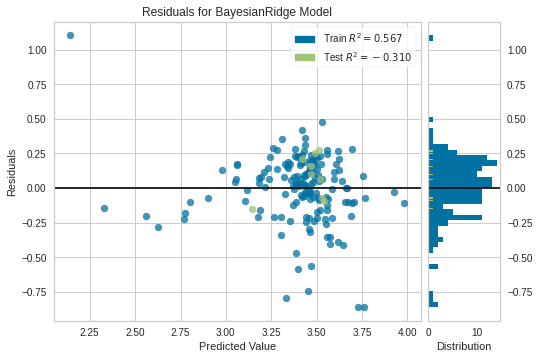

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_CES, plot = 'residuals')

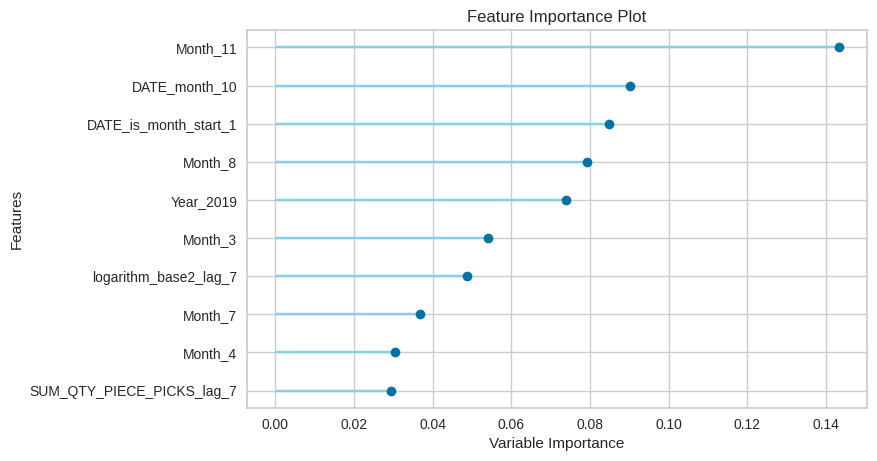

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_CES, plot = 'feature')

In [ ]:
save_model(tuned_model_CES, 'CES_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=BayesianRidge(alpha_1=0.0001, alpha_2=0.15, alpha_init=None, compute_score=True,
              copy_X=True, fit_intercept=True, lambda_1=0.15, lambda_2=1e-06,
              lambda_init=None, n_iter=300, normalize=True, tol=0.001,
              verbose=False), model_name=CES_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['COUNTRY_NAME'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='logarithm_base2',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['COUNTRY_NAME'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='logarithm_base2',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerica...
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  BayesianRidge(

In [ ]:
#loaded_model = load_model('CES_model.pkl')

### creting future datasets

In [ ]:
future_dates = pd.date_range(start=date.today(), periods=21, freq='d')
future_data = pd.DataFrame(future_dates)
# add columns
future_data.columns = ['DATE']
future_df = pd.concat([CES_data1,future_data],ignore_index=True)
name = future_df['COUNTRY_NAME'].unique()
future_df = add_values(future_df)
future_list =[]
future_list.append(future_df)

add_lags(future_list,col_list,lag)
future_list[0] = future_list[0].resample('W', on='DATE').sum()
future_list[0].reset_index(inplace = True)
add_values(future_list[0])
future_list[0] = future_list[0].drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD','logarithm_base2'], axis=1)
future_list[0] = future_list[0].fillna(future_list[0].mean())
future_list[0]['COUNTRY_NAME'] = name[0]
future_list[0].tail()

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME
191,2023-01-22,3.41,3.30,1,2023,3,6,22,738542,52045.49,...,18.57,19.36,18.89,19.10,18.87,17.15,19.83,18.32,21.41,CHE
192,2023-01-29,3.41,3.34,1,2023,4,6,29,738549,52045.49,...,17.74,18.19,18.55,19.36,18.37,19.10,18.78,17.15,20.85,CHE
193,2023-02-05,3.46,3.40,2,2023,5,6,36,738556,52045.49,...,17.48,17.59,18.15,18.19,18.78,19.36,18.79,19.10,19.71,CHE
194,2023-02-12,3.49,3.36,2,2023,6,6,43,738563,52045.49,...,17.75,17.51,17.61,17.59,18.28,18.19,18.42,19.36,18.73,CHE
195,2023-02-19,3.57,3.43,2,2023,7,6,50,738570,7435.07,...,2.54,2.54,2.51,2.30,2.58,2.51,2.64,2.63,2.69,CHE


### creating prediction

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=BayesianRidge(alpha_1=0.0001, alpha_2=0.15, alpha_init=None, compute_score=True,
              copy_X=True, fit_intercept=True, lambda_1=0.15, lambda_2=1e-06,
              lambda_init=None, n_iter=300, normalize=True, tol=0.001,
              verbose=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


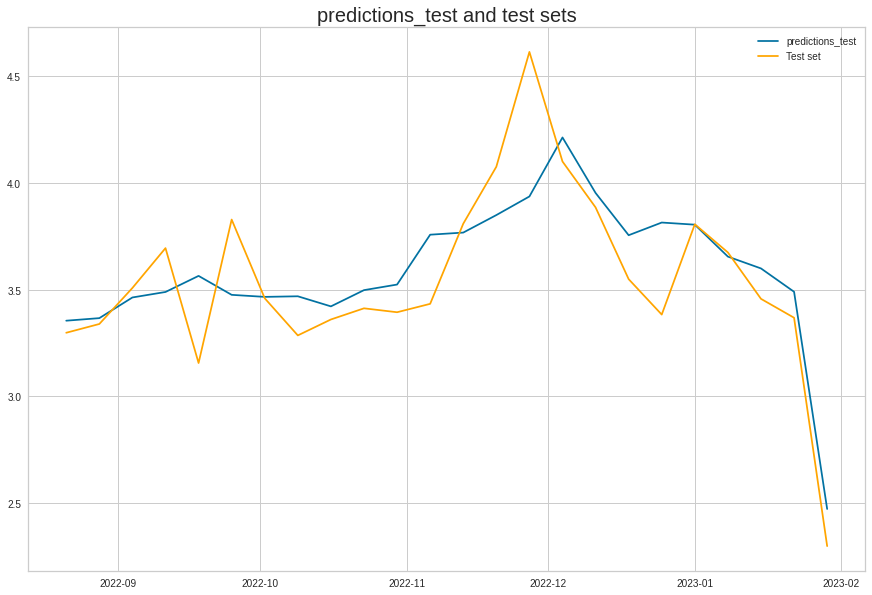

In [ ]:
predictions_test = predict_model(tuned_model_CES, data=CES_test.drop(['logarithm_base2'], axis=1))
plt.figure(figsize=(15,10))
plt.title('predictions_test and test sets', size=20)
plt.plot(predictions_test.DATE,predictions_test.Label, label='predictions_test')
plt.plot(CES_test.DATE,CES_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
predictions_CES = predict_model(tuned_model_CES, data=future_list[0])
predictions_CES['prediction'] = 10 ** predictions_CES['Label'] 
predictions_CES['COUNTRY_NAME'] = name[0]
prediction_df.append(predictions_CES)
predictions_CES.tail()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=BayesianRidge(alpha_1=0.0001, alpha_2=0.15, alpha_init=None, compute_score=True,
              copy_X=True, fit_intercept=True, lambda_1=0.15, lambda_2=1e-06,
              lambda_init=None, n_iter=300, normalize=True, tol=0.001,
              verbose=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME,Label,prediction
191,2023-01-22,3.41,3.30,1,2023,3,6,22,738542,52045.49,...,18.89,19.10,18.87,17.15,19.83,18.32,21.41,CHE,3.48,2987.21
192,2023-01-29,3.41,3.34,1,2023,4,6,29,738549,52045.49,...,18.55,19.36,18.37,19.10,18.78,17.15,20.85,CHE,3.47,2956.94
193,2023-02-05,3.46,3.40,2,2023,5,6,36,738556,52045.49,...,18.15,18.19,18.78,19.36,18.79,19.10,19.71,CHE,3.49,3078.81
194,2023-02-12,3.49,3.36,2,2023,6,6,43,738563,52045.49,...,17.61,17.59,18.28,18.19,18.42,19.36,18.73,CHE,3.51,3224.67
195,2023-02-19,3.57,3.43,2,2023,7,6,50,738570,7435.07,...,2.51,2.30,2.58,2.51,2.64,2.63,2.69,CHE,2.48,299.10


### DEU ML

In [ ]:
DEU_data1 = df_list[4].copy()
name = DEU_data1['COUNTRY_NAME'].unique()
DEU_data = DEU_data1.resample('W', on='DATE').sum()
DEU_data.reset_index(inplace = True)
DEU_data = add_values(DEU_data)
DEU_data = DEU_data.drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD'], axis=1)
DEU_data['COUNTRY_NAME'] = name[0]                              

### setting up the algorithm

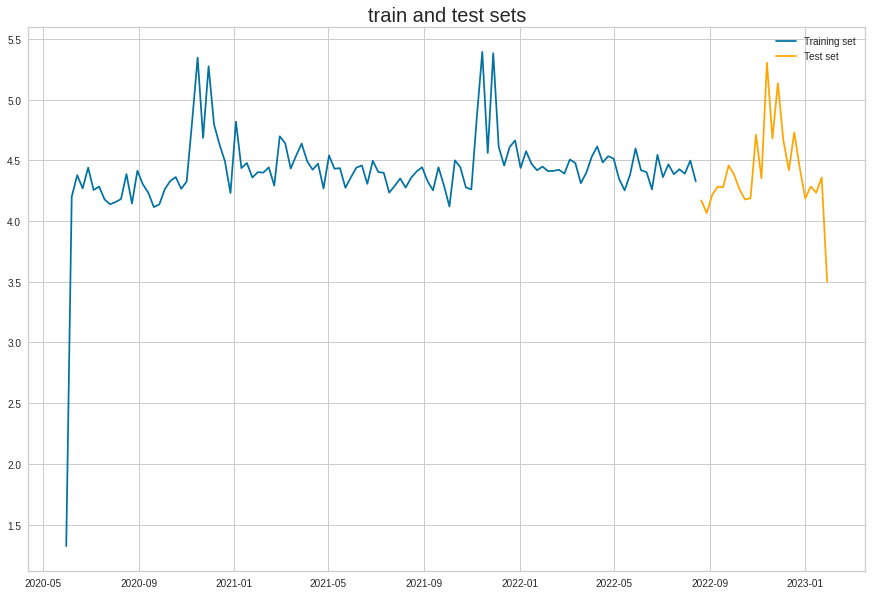

In [ ]:
test_size = 24
DEU_train = DEU_data[:-test_size]
DEU_test = DEU_data[-test_size:]
plt.figure(figsize=(15,10))
plt.title('train and test sets', size=20)
plt.plot(DEU_train.DATE,DEU_train.logarithm_base2, label='Training set')
plt.plot(DEU_test.DATE,DEU_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
s = setup(DEU_train, target = 'logarithm_base2', train_size = 0.8,
          data_split_shuffle = False, fold_strategy = 'timeseries', fold = 10,
          ignore_features = ['COUNTRY_NAME'],log_data = False,log_experiment=True,
          #numeric_features = ['day_of_year', 'year'],categorical_features = ['month', 'day_of_week'],
          silent = True, verbose = False, session_id = 127,normalize = True)

INFO:logs:PyCaret Supervised Module
INFO:logs:ML Usecase: regression
INFO:logs:version 2.3.10
INFO:logs:Initializing setup()
INFO:logs:setup(target=logarithm_base2, ml_usecase=regression, available_plots={'parameter': 'Hyperparameters', 'residuals': 'Residuals', 'error': 'Prediction Error', 'cooks': 'Cooks Distance', 'rfe': 'Feature Selection', 'learning': 'Learning Curve', 'manifold': 'Manifold Learning', 'vc': 'Validation Curve', 'feature': 'Feature Importance', 'feature_all': 'Feature Importance (All)', 'tree': 'Decision Tree', 'residuals_interactive': 'Interactive Residuals'}, train_size=0.8, test_data=None, preprocess=True, imputation_type=simple, iterative_imputation_iters=5, categorical_features=None, categorical_imputation=constant, categorical_iterative_imputer=lightgbm, ordinal_features=None, high_cardinality_features=None, high_cardinality_method=frequency, numeric_features=None, numeric_imputation=mean, numeric_iterative_imputer=lightgbm, date_features=None, ignore_features

### comparing the models

In [ ]:
best_DEU = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
en,Elastic Net,0.19,0.10,0.24,-0.75,0.04,0.04,0.01
ada,AdaBoost Regressor,0.17,0.07,0.21,-0.75,0.04,0.04,0.10
lasso,Lasso Regression,0.20,0.10,0.24,-0.88,0.04,0.04,0.01
dummy,Dummy Regressor,0.21,0.11,0.25,-1.34,0.05,0.04,0.01
llar,Lasso Least Angle Regression,0.21,0.11,0.25,-1.34,0.05,0.04,0.01
knn,K Neighbors Regressor,0.20,0.09,0.25,-1.92,0.04,0.04,0.02
rf,Random Forest Regressor,0.21,0.09,0.25,-2.17,0.04,0.04,0.23
br,Bayesian Ridge,0.35,0.30,0.42,-8.23,0.08,0.08,0.02
gbr,Gradient Boosting Regressor,0.27,0.18,0.33,-8.45,0.06,0.06,0.08
lightgbm,Light Gradient Boosting Machine,0.29,0.15,0.35,-8.87,0.06,0.06,0.03


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


### evaluating the best model

In [ ]:
evaluate_model(best_DEU)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

### TUNING MODEL

In [ ]:
tuned_model_DEU = tune_model(best_DEU)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.18,0.04,0.20,-3.19,0.04,0.04
1,0.63,0.55,0.74,-2.62,0.13,0.13
2,0.21,0.07,0.26,-1.37,0.05,0.05
3,0.19,0.05,0.22,-1.87,0.04,0.04
4,0.10,0.01,0.11,-0.36,0.02,0.02
5,0.07,0.01,0.08,-0.04,0.02,0.02
6,0.06,0.01,0.07,-0.32,0.01,0.01
7,0.16,0.04,0.21,-0.02,0.04,0.04
8,0.39,0.29,0.54,-1.14,0.09,0.08


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 3
INFO:logs:ElasticNet(alpha=4.25, copy_X=True, fit_intercept=True, l1_ratio=0.302,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


### ploting resudue and best features 

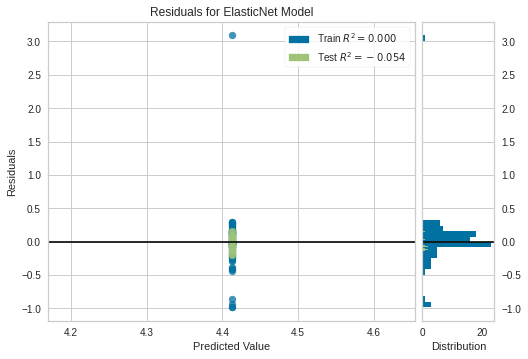

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_DEU, plot = 'residuals')


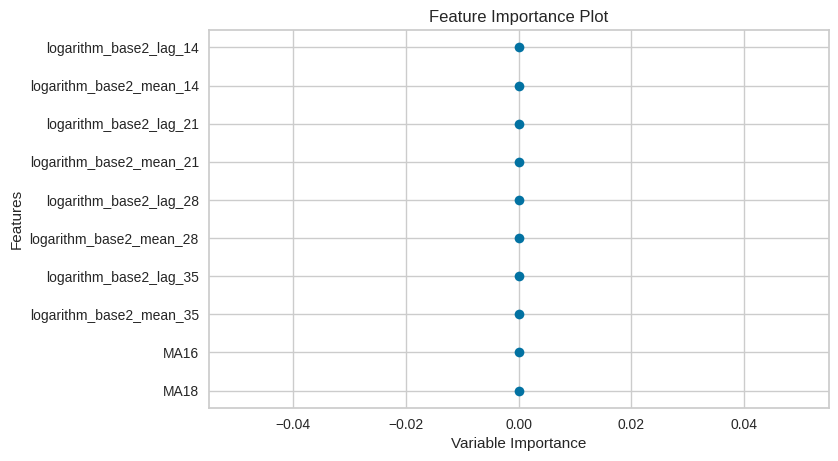

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_model_DEU, plot = 'feature')

### saving the model

In [ ]:
save_model(tuned_model_DEU, 'DEU_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=ElasticNet(alpha=4.25, copy_X=True, fit_intercept=True, l1_ratio=0.302,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False), model_name=DEU_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['COUNTRY_NAME'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='logarithm_base2',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
            

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['COUNTRY_NAME'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='logarithm_base2',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerica...
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  ElasticNet(alp

### loading the model

In [ ]:
#loaded_model = load_model('DEU_model')

### preparing future datasets 

In [ ]:
future_dates = pd.date_range(start=date.today(), periods=21, freq='d')
future_data = pd.DataFrame(future_dates)
# add columns
future_data.columns = ['DATE']
future_df = pd.concat([CES_data1,future_data],ignore_index=True)
name = future_df['COUNTRY_NAME'].unique()
future_df = add_values(future_df)
future_list =[]
future_list.append(future_df)

add_lags(future_list,col_list,lag)
future_list[0] = future_list[0].resample('W', on='DATE').sum()
future_list[0].reset_index(inplace = True)
add_values(future_list[0])
future_list[0] = future_list[0].drop(['SUM_QTY_PIECE_PICKS','NBR_ORDERS','SUM_QTY_TOTAL_PICKS','DW_SUM_ORDQTY_AD','DW_QTY_REC_LS','TOTAL_ORDNUM_LS','TOTAL_ORDNUM_AD','logarithm_base2'], axis=1)
future_list[0] = future_list[0].fillna(future_list[0].mean())
future_list[0]['COUNTRY_NAME'] = name[0]
future_list[0].tail()

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_7,logarithm_base2_lag_14,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME
191,2023-01-22,3.41,3.30,1,2023,3,6,22,738542,52045.49,...,18.57,19.36,18.89,19.10,18.87,17.15,19.83,18.32,21.41,CHE
192,2023-01-29,3.41,3.34,1,2023,4,6,29,738549,52045.49,...,17.74,18.19,18.55,19.36,18.37,19.10,18.78,17.15,20.85,CHE
193,2023-02-05,3.46,3.40,2,2023,5,6,36,738556,52045.49,...,17.48,17.59,18.15,18.19,18.78,19.36,18.79,19.10,19.71,CHE
194,2023-02-12,3.49,3.36,2,2023,6,6,43,738563,52045.49,...,17.75,17.51,17.61,17.59,18.28,18.19,18.42,19.36,18.73,CHE
195,2023-02-19,3.57,3.43,2,2023,7,6,50,738570,7435.07,...,2.54,2.54,2.51,2.30,2.58,2.51,2.64,2.63,2.69,CHE


### making predictions

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=ElasticNet(alpha=4.25, copy_X=True, fit_intercept=True, l1_ratio=0.302,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


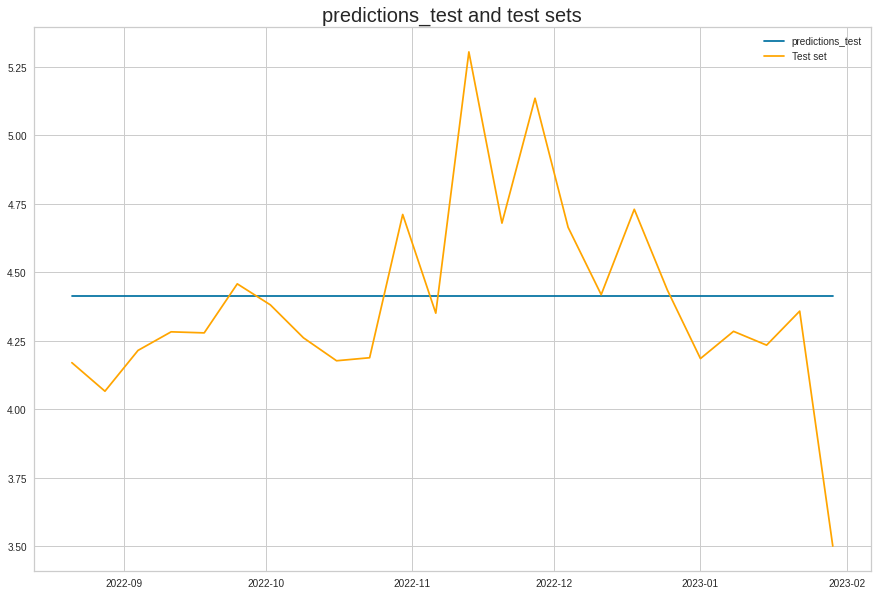

In [ ]:
predictions_test = predict_model(tuned_model_DEU, data=DEU_test.drop(['logarithm_base2'], axis=1))
plt.figure(figsize=(15,10))
plt.title('predictions_test and test sets', size=20)
plt.plot(predictions_test.DATE,predictions_test.Label, label='predictions_test')
plt.plot(DEU_test.DATE,DEU_test.logarithm_base2, label='Test set', color='orange')
plt.legend();

In [ ]:
predictions_DEU = predict_model(tuned_model_DEU, data=future_list[0])
predictions_DEU['prediction'] = 10 ** predictions_DEU['Label'] 
predictions_DEU['COUNTRY_NAME'] = name[0]
prediction_df.append(predictions_DEU)
predictions_DEU.tail()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=ElasticNet(alpha=4.25, copy_X=True, fit_intercept=True, l1_ratio=0.302,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=127, selection='cyclic', tol=0.0001, warm_start=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME,Label,prediction
191,2023-01-22,3.41,3.30,1,2023,3,6,22,738542,52045.49,...,18.89,19.10,18.87,17.15,19.83,18.32,21.41,CHE,4.41,25836.85
192,2023-01-29,3.41,3.34,1,2023,4,6,29,738549,52045.49,...,18.55,19.36,18.37,19.10,18.78,17.15,20.85,CHE,4.41,25836.85
193,2023-02-05,3.46,3.40,2,2023,5,6,36,738556,52045.49,...,18.15,18.19,18.78,19.36,18.79,19.10,19.71,CHE,4.41,25836.85
194,2023-02-12,3.49,3.36,2,2023,6,6,43,738563,52045.49,...,17.61,17.59,18.28,18.19,18.42,19.36,18.73,CHE,4.41,25836.85
195,2023-02-19,3.57,3.43,2,2023,7,6,50,738570,7435.07,...,2.51,2.30,2.58,2.51,2.64,2.63,2.69,CHE,4.41,25836.85


### concatenating all predictions to one dataset 

In [ ]:
concatenated_predictions = pd.concat(prediction_df)

In [ ]:
concatenated_predictions

,DATE,MA18,MA16,Month,Year,WEEK_YEAR,day_of_week,DAY_YEAR,DATE_N,TOTAL_ORDNUM_LS_lag_7,...,logarithm_base2_mean_14,logarithm_base2_lag_21,logarithm_base2_mean_21,logarithm_base2_lag_28,logarithm_base2_mean_28,logarithm_base2_lag_35,logarithm_base2_mean_35,COUNTRY_NAME,Label,prediction
0,2019-09-01,3.51,3.52,9,2019,35,6,244,737303,7332.85,...,2.63,2.63,2.63,2.62,2.64,2.63,2.64,AUT,0.78,6.00
1,2019-09-08,3.51,3.52,9,2019,36,6,251,737310,36664.26,...,13.16,13.13,13.17,13.12,13.19,13.13,13.19,AUT,3.17,1466.91
2,2019-09-15,3.51,3.52,9,2019,37,6,258,737317,53882.70,...,18.42,18.38,18.44,18.37,18.46,18.39,18.46,AUT,3.35,2214.60
3,2019-09-22,3.51,3.52,9,2019,38,6,265,737324,64124.85,...,18.42,18.38,18.44,18.37,18.46,18.39,18.46,AUT,3.35,2251.21
4,2019-09-29,3.51,3.52,9,2019,39,6,272,737331,62208.85,...,18.42,11.16,18.44,18.37,18.46,18.39,18.46,AUT,3.35,2254.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,2023-01-22,3.41,3.30,1,2023,3,6,22,738542,52045.49,...,18.89,19.10,18.87,17.15,19.83,18.32,21.41,CHE,4.41,25836.85
192,2023-01-29,3.41,3.34,1,2023,4,6,29,738549,52045.49,...,18.55,19.36,18.37,19.10,18.78,17.15,20.85,CHE,4.41,25836.85
193,2023-02-05,3.46,3.40,2,2023,5,6,36,738556,52045.49,...,18.15,18.19,18.78,19.36,18.79,19.10,19.71,CHE,4.41,25836.85
194,2023-02-12,3.49,3.36,2,2023,6,6,43,738563,52045.49,...,17.61,17.59,18.28,18.19,18.42,19.36,18.73,CHE,4.41,25836.85


### Register our Data output

In [ ]:
try:
    Dataset.Tabular.register_pandas_dataframe(dataframe = concatenated_predictions,
                                               target = az_store,
                                               name = 'predictions_contries',
                                                description='predictions_from all countries')
except Exception as ex:
    print('Error register_pandas_dataframe: ', ex)

Message: rslex failed, falling back to clex.
Payload: {"pid": 60968, "source": "azureml.dataprep", "version": "4.8.4", "trace": "azureml|data|dataset_factory.py, line 655 in function register_pandas_dataframe.\nazureml|data|_loggerfactory.py, line 132 in function wrapper.\n<ipython-input-84-74dcc25400d0>, line 2 in function <module>.", "subscription": "", "run_id": "", "resource_group": "", "workspace_name": "", "experiment_id": "", "location": "", "rslex_version": "2.15.2"}


Validating arguments.
Arguments validated.
Successfully obtained datastore reference and path.
Uploading file to managed-dataset/8a9fac27-b00f-471c-a2d5-bad03462fb35/
Successfully uploaded file to datastore.
Creating and registering a new dataset.


Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'
Failed to extract subscription information, Exception=AttributeError; 'Logger' object has no attribute 'activity_info'


Successfully created and registered a new dataset.


### complete the experiment

In [ ]:
experiment_run.complete()